<h1>Korean Drama Recommender</h1>
<h3>Goals for this project:</h3>
<ul>
<li>Based on a Korean drama series that I enjoyed, find Korean dramas that are similar to it.</li>
<li>We will calculate the similarity of two series based on viewer ratings.</li>
<li>For each series, we will generate a vector of viewer ratings, and judge their similarity using the cosine similarity (dot product) of the vectors.</li>
</ul>

<h1>Scraping the Data</h1>
<ul><li>
We will scrape www.viki.com, a popular Korean drama streaming website, for the viewer ratings. We will use the requests library:
</li></ul>

In [1]:
from requests_html import AsyncHTMLSession
asession = AsyncHTMLSession()

# get page with all of the Korean dramas on the website
r = await asession.get("https://www.viki.com/categories/country/korea/genre/all")

# asynchronously render the page so that JavaScript elements are loaded
await r.html.arender(sleep=2, keep_page=True, scrolldown=500) # scroll down every 2 seconds

# .ilalLZ is the className of the anchor tags we are interested in
links = r.html.find(".ilalLZ")[0].absolute_links # get links to each Korean drama's page
print(len(links))
links

1081


{'https://www.viki.com/tv/38019c-growing-season',
 'https://www.viki.com/tv/23594c-diary-of-a-night-watchman',
 'https://www.viki.com/tv/3870c-the-king-2-hearts',
 'https://www.viki.com/tv/3475c-to-the-beautiful-you',
 'https://www.viki.com/tv/37480c-mr-queen',
 'https://www.viki.com/tv/35617c-just-between-lovers',
 'https://www.viki.com/tv/39082c-red-balloon',
 'https://www.viki.com/tv/37012c-lover-of-the-palace',
 'https://www.viki.com/movies/37625c-best-friend',
 'https://www.viki.com/movies/38006c-obsessed',
 'https://www.viki.com/tv/37959c-nct-life-in-chuncheon-hongcheon',
 'https://www.viki.com/movies/38186c-show-me-the-ghost',
 'https://www.viki.com/tv/11742c-when-a-man-falls-in-love',
 'https://www.viki.com/movies/37546c-josee',
 'https://www.viki.com/tv/38461c-the-killers-shopping-list',
 'https://www.viki.com/tv/25824c-hyde-jekyll-me',
 'https://www.viki.com/tv/39162c-2022-sbs-drama-awards',
 'https://www.viki.com/tv/38634c-bad-girlfriend',
 'https://www.viki.com/tv/28448c-sh

<ul><li>
    Now we need to do a further API request for each one of the links we pulled.
    <li>We will then have the user ratings we are interested in.</li>
</li></ul>

In [2]:
import requests
import pandas as pd

def getReviews(url, reviews_per_page = 50):
    # get the end of the URL where the drama name is located
    url_code = url.split("/")[-1].split("c")[0] 
    
    # first, get the total number of reviews for this drama
    request_url = f"https://api.viki.io/v4/containers/{url_code}c/reviews.json"

    # query parameters
    querystring = {"per_page":"1",
                   "has_review_note":"1",
                   "sort":"review_rank",
                   "direction":"desc",
                   "page":"1",
                   "app":"100000a"}
    
    # headers
    headers = {
            "authority": "api.viki.io",
            "Accept": "application/json",
            "accept-language": "en-US,en;q=0.9",
            "content-type": "application/json",
            "origin": "https://www.viki.com",
            "referer": "https://www.viki.com/",
            "sec-ch-ua": "^\^Not_A",
            "sec-ch-ua-mobile": "?0",
            "sec-ch-ua-platform": "^\^Windows^^",
            "sec-fetch-dest": "empty",
            "sec-fetch-mode": "cors",
            "sec-fetch-site": "cross-site",
            "user-agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/109.0.0.0 Safari/537.36"
        }
    
    # send API request
    response = requests.request("GET", request_url, headers=headers, params=querystring)
    num_reviews = response.json()["count"]

    # collect ratings and return data as a Pandas dataframe
    reviews = []
    for i in range(num_reviews // reviews_per_page + 1):
        # query params
        querystring = {"per_page":str(reviews_per_page),
                       "has_review_note":"1",
                       "sort":"review_rank",
                       "direction":"desc",
                       "page":i,
                       "app":"100000a"}

        # finally getting the actual values for the ratings
        response = requests.request("GET", request_url, headers=headers, params=querystring)
        data = response.json()

        for review in data["response"]:
            reviews.append(review)

    # create DataFrame by flattening the JSON strings
    ratings = pd.json_normalize(reviews).set_index("id").user_content_rating
    ratings.name = url.split("/")[-1]

    return ratings

In [3]:
total_ratings = []
errors = []

# loop through the URLs
for link in links:
    try:
        ratings.append(getReviews(link))
    except:
        errors.append(link)
        print(f"Couldn't scrape reviews for {link}")

Couldn't scrape reviews for https://www.viki.com/tv/39118c-idol-k-goods-tour-paradao
Couldn't scrape reviews for https://www.viki.com/movies/38625c-man-on-the-edge
Couldn't scrape reviews for https://www.viki.com/tv/37374c-true-beauty
Couldn't scrape reviews for https://www.viki.com/tv/38853c-drink-with-god-2
Couldn't scrape reviews for https://www.viki.com/tv/33538c-while-you-were-sleeping
Couldn't scrape reviews for https://www.viki.com/tv/35835c-whats-wrong-with-secretary-kim


<h1>Analyze the Scraped Data</h1>
<ul><li>Well, among 1081 URLs we managed to get only 6 errors, which isn't bad at all.</li>
<li>However, further analysis is needed on these failed URLs.</li>

<li>After loading up these links, I see that https://www.viki.com/tv/39118c-idol-k-goods-tour-paradao, https://www.viki.com/tv/38853c-drink-with-god-2, and https://www.viki.com/movies/38625c-man-on-the-edge actually don't have any reviews on viki.com, so we can ignore them.</li>  
    
<li>The URLs https://www.viki.com/tv/35835c-whats-wrong-with-secretary-kim, https://www.viki.com/tv/33538c-while-you-were-sleeping, and https://www.viki.com/tv/37374c-true-beauty are probably failing due to the opposite issue: they have too many reviews (48558, 27076, 65988 respectively), so the API calls to grab all of these were probably overloading the bandwidth of the server.</li>  
    
<li>Let's try sending our requests with periodic timing:</li>
   
</ul>

In [7]:
import time

# this is essentially the same function as before, with one line added (see below)
def newGetReviews(url, reviews_per_page = 50):
    url_code = url.split("/")[-1].split("c")[0] 
    
    request_url = f"https://api.viki.io/v4/containers/{url_code}c/reviews.json"

    querystring = {"per_page":"1",
                   "has_review_note":"1",
                   "sort":"review_rank",
                   "direction":"desc",
                   "page":"1",
                   "app":"100000a"}
    
    headers = {
            "authority": "api.viki.io",
            "Accept": "application/json",
            "accept-language": "en-US,en;q=0.9",
            "content-type": "application/json",
            "origin": "https://www.viki.com",
            "referer": "https://www.viki.com/",
            "sec-ch-ua": "^\^Not_A",
            "sec-ch-ua-mobile": "?0",
            "sec-ch-ua-platform": "^\^Windows^^",
            "sec-fetch-dest": "empty",
            "sec-fetch-mode": "cors",
            "sec-fetch-site": "cross-site",
            "user-agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/109.0.0.0 Safari/537.36"
        }
    
    response = requests.request("GET", request_url, headers=headers, params=querystring)
    num_reviews = response.json()["count"]

    reviews = []
    for i in range(num_reviews // reviews_per_page + 1):
        querystring = {"per_page":str(reviews_per_page),
                       "has_review_note":"1",
                       "sort":"review_rank",
                       "direction":"desc",
                       "page":i,
                       "app":"100000a"}
        
        response = requests.request("GET", request_url, headers=headers, params=querystring)
        
        if i % 100 == 0: time.sleep(2) # wait two seconds after loading every 100th page
            
        data = response.json()

        for review in data["response"]:
            reviews.append(review)

    ratings = pd.json_normalize(reviews).set_index("id").user_content_rating
    ratings.name = url.split("/")[-1]

    return ratings

secretary_kim = newGetReviews("https://www.viki.com/tv/35835c-whats-wrong-with-secretary-kim")

In [9]:
were_sleeping = newGetReviews("https://www.viki.com/tv/33538c-while-you-were-sleeping")

In [11]:
true_beauty = newGetReviews("https://www.viki.com/tv/37374c-true-beauty")

In [12]:
print(secretary_kim.isnull().sum())
print(were_sleeping.isnull().sum())
print(true_beauty.isnull().sum())

0
0
0


<ul><li>That seemed to work. We can include these dramas in our ratings dataset now.</li></ul>

In [13]:
ratings.append(secretary_kim)
ratings.append(were_sleeping)
ratings.append(true_beauty)
ratings


[id
 18836942rv    10
 25997366rv    10
 27535132rv    10
 24132473rv    10
 26186734rv     4
 23537058rv     9
 22158303rv    10
 27398118rv    10
 29050180rv    10
 23502750rv    10
 29632933rv    10
 28791542rv    10
 24431622rv    10
 28349778rv    10
 29055781rv    10
 22019200rv     8
 25378999rv    10
 21725355rv    10
 29489023rv    10
 27591327rv    10
 23254021rv    10
 27751985rv    10
 23054232rv    10
 27421471rv    10
 26990782rv     9
 18265046rv     8
 19221343rv    10
 20858202rv    10
 27346571rv     9
 19574012rv    10
 19577102rv    10
 29786842rv     9
 29504681rv    10
 20786432rv    10
 19131156rv    10
 20682163rv    10
 21273455rv    10
 20190344rv    10
 26170446rv     9
 27025645rv    10
 28446623rv    10
 27774605rv     9
 15150547rv     8
 23159665rv    10
 28418597rv     9
 27790955rv    10
 22952828rv    10
 21260685rv    10
 18930927rv    10
 21636336rv    10
 Name: 38019c-growing-season, dtype: int64,
 id
 29713135rv     9
 29162579rv     6
 29776721rv 

In [16]:
ratings_df = pd.concat(ratings, axis=1) # combine the Series objects into a DataFrame
ratings_df.shape # number of dramas should be 1081 - 3 = 1078

(49038, 1078)

<ul><li>So there are 49038 different users that wrote reviews with ratings.</li>
<li>Now let's do some EDA by printing the percentage of null values and the minimum, maximum, and average ratings across the table.</li></ul>

In [17]:
print(ratings_df.isnull().sum().sum() / (ratings_df.shape[0] * ratings_df.shape[1]))
print(ratings_df.max().max())
print(ratings_df.min().min())
print(ratings_df.mean().mean())
ratings_df

0.9990723562152134
10.0
1.0
9.119961764491977


,38019c-growing-season,23594c-diary-of-a-night-watchman,3870c-the-king-2-hearts,3475c-to-the-beautiful-you,37480c-mr-queen,35617c-just-between-lovers,39082c-red-balloon,37012c-lover-of-the-palace,37625c-best-friend,38006c-obsessed,...,38038c-chimera,38313c-color-rush-2,28227c-i-have-a-lover,37977c-voice-of-silence,36110c-i-picked-up-a-celebrity-on-the-street,37745c-rookie-king-channel-bts,2849c-i-love-you,35835c-whats-wrong-with-secretary-kim,33538c-while-you-were-sleeping,37374c-true-beauty
id,,,,,,,,,,,,,,,,,,,,,
18836942rv,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25997366rv,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27535132rv,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24132473rv,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26186734rv,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18532708rv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0
17864404rv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0
15811447rv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0


<ul><li>
Sadly, our matrix is quite sparse (and not in the sense of having zeros!). 
This is clearly an indication that the vast majority of reviewers only reviewed a few dramas at most.
</li>
<li>This dataset won't be too useful, but I've done a lot of work in collecting this dataset, so I'll do some further exploration before calling it quits.</li>
<li>
    
The maximum rating was 10 and the minimum rating was 1, so the average rating on this scale is (10 + 1)/2 = 5.5. So, makes sense to assign the average rating of 5.5 to dramas that the users have not had the interest to watch, presumably due to indifference.
    
</li></ul>

In [18]:
df_filled = ratings_df.fillna(5.5)

<ul><li>First, lets plot the average rating of each drama, recentered on the rating scale's average rating of 5.5:</li></ul>

<AxesSubplot: xlabel='Mean Rating', ylabel='Drama Name'>

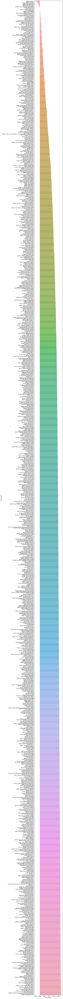

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(5, 180))

# get the mean rating of each drama
bar_data = df_filled.mean().reset_index().rename({"index" : "Drama Name", 0 : "Mean Rating"}, axis=1)

# get the deviations from the average
bar_data["Mean Rating"] -= 5.5

sns.barplot(data=bar_data.sort_values(by="Mean Rating"), x = "Mean Rating", y = "Drama Name")

<ul><li>Now let's see the standard errors in order to gauge the spread. This will highlight the most polarizing or controversial dramas, measured in terms of rating diversity.</li></ul>

<AxesSubplot: xlabel='Rating SEM', ylabel='Drama Name'>

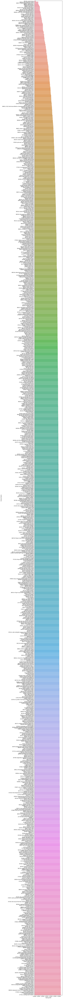

In [37]:
plt.figure(figsize=(5, 180))
bar_data = df_filled.sem().reset_index().rename({"index" : "Drama Name", 0 : "Rating SEM"}, axis=1)
sns.barplot(data=bar_data.sort_values(by="Rating SEM"), x = "Rating SEM", y = "Drama Name")

<h1>Conclusion</h1>
<ul><li>
It looks like the most popular drama is <i>Inseparable Bros</i>, which does not match the first result for Sort:Popular on viki.com (<i>The Forbidden Marriage</i>).
    </li><li>
    Also, it appears that the most controversial drama (in terms of rating standard deviation) is <i>Running Man Classics</i></li></ul>